# K-Means Clustering

###
A.Imports
i. Imports libraries and re-editing the mall datasets
ii. Import dependencies

B.EDA
i. Data Cleaning
ii. Data analysis and pre-processing

C. Model Development
i. K-Means Clustering
ii. Hierarchical(Agglomerative) Clustering
iii. DBSCAN Clsutering

D. Evaluation
i Elbow Method
ii. Silhoutte Analysis
iii. Silhoutte Score

E. Data Analysis
i. Females underage group of 25-35 years do massive shopping
ii. Annual Income and Spending Score is led by female
iii. Correlations between Age, Annual Income and Spending Score
iv. Scatter plot and heatmap visualizations

## A. Imports
i. Imports libraries and re-editing the mall datasets
ii. Import dependencies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

### The data analysis and machine learning libraries were imported:
Pandas for creating and manipulating data frames
NumPy for performing algebraic computing
Sklearn for machine learning model building
Matplotlib, and Seaborn for data visualizations and other inbuilt libraries. 

In [2]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [3]:
%matplotlib inline

In [4]:
import plotly.express as px
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

In [5]:
#LOADING DATASET
df = pd.read_excel(("/Users/binitashrestha/Documents/CopyMall.xlsx"))

In [6]:
#LENGTH OF DATASET
df.shape

(370213, 5)

### The length of dataset imported is 370213 rows and 5 columns that includes CustomerID, Gender, Age, Annual Annual Income and Spending Score.

In [7]:
#OVERVIEW OF DATASET
df.head()

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1.0,Male,19.0,15.0,39.0
1,2.0,Male,21.0,15.0,81.0
2,3.0,Female,20.0,16.0,6.0
3,4.0,Female,23.0,16.0,77.0
4,5.0,Female,31.0,17.0,40.0


In [8]:
#OVERVIEW OF DATASET
df.describe()

,CustomerID,Age,Annual Income (k$),Spending Score (1-100)
count,66237.000000,367779.000000,365816.000000,366965.000000
mean,69997.716790,38.860889,60.366274,50.198142
std,85713.328731,13.953249,26.113443,25.734476
min,1.000000,18.000000,15.000000,1.000000
25%,16560.000000,28.000000,40.000000,35.000000
50%,33119.000000,36.000000,61.000000,50.000000
75%,74872.000000,49.000000,78.000000,73.000000
max,370214.000000,70.000000,137.000000,99.000000


In [9]:
#OVERVIEW OF DATASET
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 370213 entries, 0 to 370212
Data columns (total 5 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   CustomerID              66237 non-null   float64
 1   Gender                  369085 non-null  object 
 2   Age                     367779 non-null  float64
 3   Annual Income (k$)      365816 non-null  float64
 4   Spending Score (1-100)  366965 non-null  float64
dtypes: float64(4), object(1)
memory usage: 14.1+ MB


## B. EDA

i. Data Cleaning
ii. Data analysis and pre-processing

In [10]:
#FINDING ROWS WITH NULLS VALUES
df.isna().sum().to_frame(name='# of missing values')

,# of missing values
CustomerID,303976
Gender,1128
Age,2434
Annual Income (k$),4397
Spending Score (1-100),3248


### The provided dataset has null values which will be discarded in the following steps.

In [11]:
####REMOVE ALL ROWS WITH NULL VALUES
total_rows =  df.shape[0]
df.dropna(how='any',inplace=True)
remaining_rows= df.shape[0]

removed_rows = total_rows-remaining_rows
print("No. of rows removed :", removed_rows)

print(f"\nPercentage of data removed:{np.round((removed_rows/total_rows)*100,2)}%")
print(f"Percentage of data remaining:{np.round((remaining_rows/total_rows)*100,2)}%")

No. of rows removed : 304948

Percentage of data removed:82.37%
Percentage of data remaining:17.63%


In [12]:
#rechecking the length of shape
df.shape

(65265, 5)

In [13]:
#RE-OVERVIEW OF COLUMNS AVAILABLE
df.columns

Index(['CustomerID', 'Gender', 'Age', 'Annual Income (k$)',
       'Spending Score (1-100)'],
      dtype='object')

## E. Data Analysis
i. Females underage group of 25-35 years do massive shopping
ii. Annual Income and Spending Score is led by female
iii. Correlations between Age, Annual Income and Spending Score
iv. Scatter plot and heatmap visualizations

<Figure size 432x288 with 0 Axes>

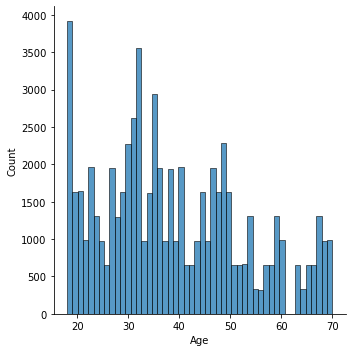

<Figure size 432x288 with 0 Axes>

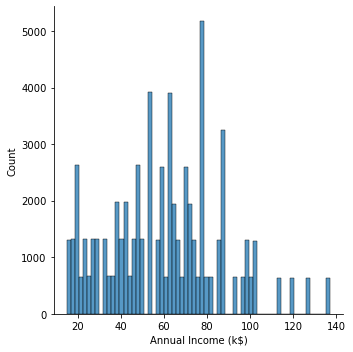

<Figure size 432x288 with 0 Axes>

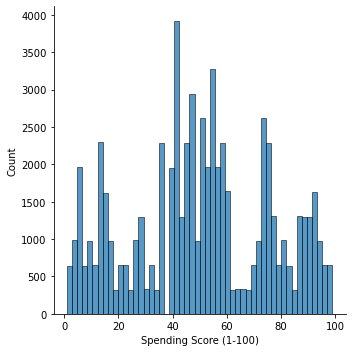

In [14]:
#PLOTING OF GENDER, ANNUAL INCOME AND SPENDING SCORE
columns=['Age', 'Annual Income (k$)','Spending Score (1-100)']
for i in columns:
    plt.figure()
    sns.displot(df[i])

### Plotting bargraph of gender, annual income and spending score to see how the dataset looks like.

<AxesSubplot:xlabel='Annual Income (k$)', ylabel='Density'>

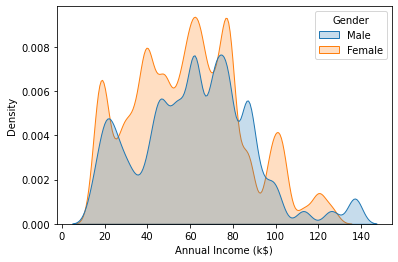

In [15]:
sns.kdeplot(df['Annual Income (k$)'], shade= True, hue= df['Gender'])

In [16]:
#number of values of male and female
df['Gender'].value_counts()

Female    36565
Male      28700
Name: Gender, dtype: int64

In [17]:
df['Gender'].value_counts(normalize= True)

Female    0.560254
Male      0.439746
Name: Gender, dtype: float64

###As per the dataset, while analyzing gender with their age, we can see the female age group of 25 years above to under 35 years do massive shopping compared against the counterparts. The massive peak can be seen at age of 30 years. Another massive rise can be observed from 45 to 50 years or peaking at 50 years while male gender have comparatively less fluctuations. 

Similarly, Females leading can be observed for both Annual Income and Spending Score with provided data. The massive peak can be seen at around 40-85 years. Similary the spending score is maximum at age of 40 to 50 years for both age groups. This can also be a defect of the random re-edited dataset and further investigation of data quality can be done.  However, the analysis algorithm that we have developed can be replicable for any future datasets for the firm. 

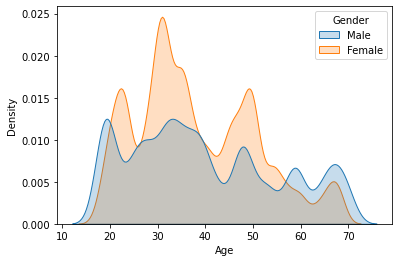

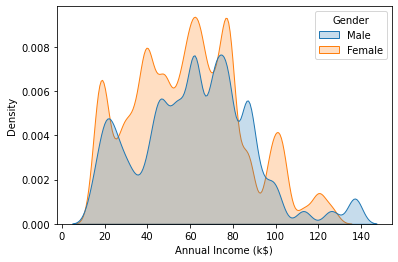

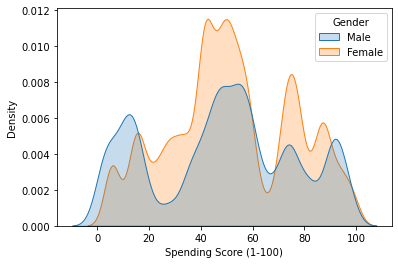

In [18]:
columns=['Age', 'Annual Income (k$)','Spending Score (1-100)']
for i in columns:
    plt.figure()
    sns.kdeplot(df[i], shade= True, hue= df['Gender'])

In [19]:
import warnings
warnings.filterwarnings('ignore')
#to discard all warning signals

In [20]:
df.groupby(['Gender'])['Age', 'Annual Income (k$)',
       'Spending Score (1-100)'].mean()

,Age,Annual Income (k$),Spending Score (1-100)
Gender,,,
Female,38.100096,59.037085,51.514290
Male,39.825610,62.001568,48.526934


### We have compared gender against age, annual income and spending score to find the mean for both gender. This gives results as:
The mean age for female is 38.099013 years and for male is 39.830010 years who does the shopping.
The mean annual income they have is $59.051028  for female and $62.023905  for male.
The mean spending score is 51.522270  for female and 48.512401  for male.

In [22]:
df.shape

(65265, 4)

In [21]:
#Discarding customerID since it has 90% rows of null values.
df.drop('CustomerID',axis=1,inplace=True)

In [23]:
df.corr()

,Age,Annual Income (k$),Spending Score (1-100)
Age,1.000000,-0.011372,-0.328380
Annual Income (k$),-0.011372,1.000000,0.009907
Spending Score (1-100),-0.328380,0.009907,1.000000


###The correlations between these columns show that column Age is negatively correlated with Annual Income and Spending score. Similarly, the Annual Income and Spending scores hold a positive relationship with each other. The scatter plot showed a distinct number of clusters.   

<AxesSubplot:xlabel='Annual Income (k$)', ylabel='Spending Score (1-100)'>

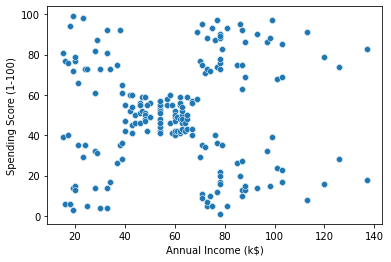

In [24]:
#scatterplot visualization of correlation between age , annual income and spendig score.
sns.scatterplot(data=df, x='Annual Income (k$)',y='Spending Score (1-100)' )

<AxesSubplot:>

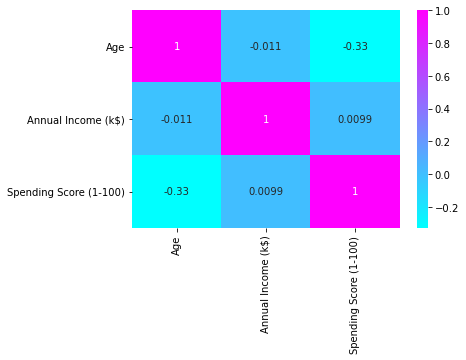

In [25]:
#heatmap visualization of correlation between age , annual income and spendig score.
sns.heatmap(df.corr(), annot= True, cmap='cool')

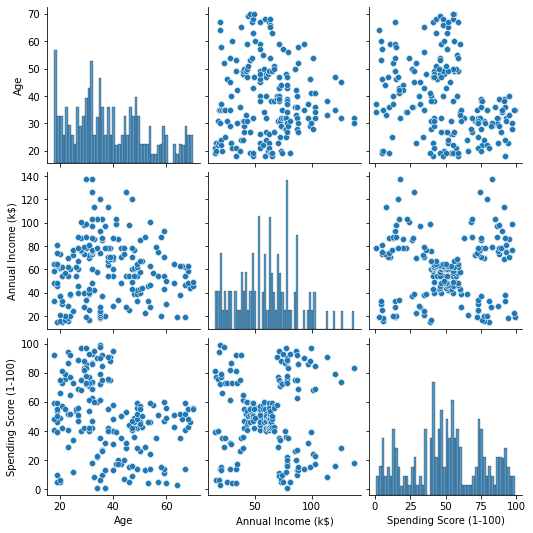

In [26]:
#grid pairplot 
sns.pairplot(df)

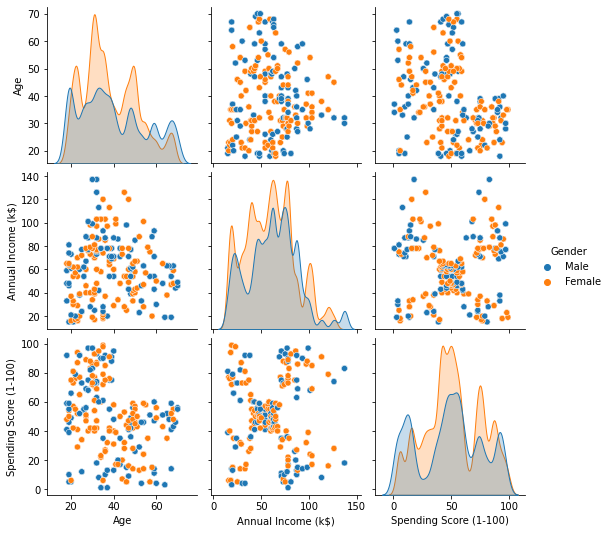

In [27]:
#grid pairplot with respect to gender
sns.pairplot(df, hue= 'Gender')

In [28]:
df['Gender'] = df['Gender'].apply(lambda x: 0 if x=='Male' else 1)

In [29]:
df['Gender']

0         0
1         0
2         1
3         1
4         1
         ..
309570    0
309571    1
309572    0
309573    1
309574    1
Name: Gender, Length: 65265, dtype: int64

In [30]:
df.columns

Index(['Gender', 'Age', 'Annual Income (k$)', 'Spending Score (1-100)'], dtype='object')

In [31]:
#OUTPUTS WITH GENDER ENCODING WITH NUMERICAL VALUES.
df.describe()

,Gender,Age,Annual Income (k$),Spending Score (1-100)
count,65265.000000,65265.000000,65265.000000,65265.000000
mean,0.560254,38.858883,60.340703,50.200613
std,0.496360,13.950542,26.152092,25.739818
min,0.000000,18.000000,15.000000,1.000000
25%,0.000000,28.000000,40.000000,35.000000
50%,1.000000,36.000000,61.000000,50.000000
75%,1.000000,49.000000,78.000000,73.000000
max,1.000000,70.000000,137.000000,99.000000


## C. Model Development
i. K-Means Clustering

In [32]:
#importing all the required ML libraries 
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples,silhouette_score
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import DBSCAN
from collections import Counter
from sklearn.decomposition import PCA

###Calling standard scaler function to remove the mean and scaling to unit variance. Here, the fit() function calculates the values of these parameters. The transform function applies the values of the parameters on the actual data and gives the normalized value. The fit_transform() function performs both in the same step. 

In [33]:
scaler = StandardScaler()
scaler.fit(df)
X = scaler.transform(df)

###This algorithm is used to find the ideal number of clusters ‘n’ and choosing the centroids in a wise fashion is expected for improved results where each item is assigned to the nearest centroid. The next function we called was wcss= [] which is also known as within cluster sum of squares along with ss = []  or silouette score for i in range(2,15) means that the algorithm will make eight iterations for different values of n along with silhoutte analysis.

In [34]:
wcss= []   # within cluster sum of squares
ss = []    # adding silouette score
for i in range(2,15): #range is started from 2 to 15 iterations
    model = KMeans(n_clusters=i)
    model.fit_transform(X)
    wcss.append(model.inertia_) #append the model.intertia 
    ss.append(silhouette_score(X,labels=model.predict(df)))


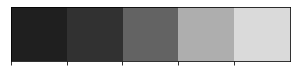

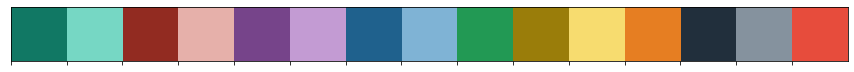

In [35]:
#SELECTING COLORS THAT CAN BE USED FOR THE PLOTTING BELOW
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']
sns.palplot(colors_dark)
#colors_mix = ["#17869E", '#264D58', '#179E66', '#D35151', '#E9DAB4', '#E9B4B4', '#D3B651', '#6351D3']
colors_mix = ['#117864', '#76D7C4', '#922B21','#E6B0AA','#76448A', '#C39BD3', '#1F618D', '#7FB3D5', '#229954', '#9A7D0A', '#F7DC6F','#E67E22', '#212F3C', '#85929E','#E74C3C']
sns.palplot(colors_mix)


## D. Evaluation
i Elbow Method
ii. Silhoutte Analysis
iii. Silhoutte Score

###We are plotting the silhoutte score and inertia using Elbow method.

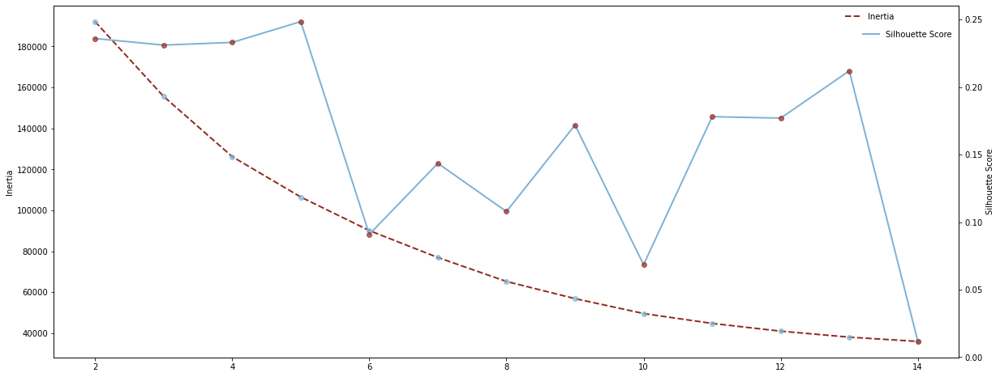

In [36]:
fig,ax1 = plt.subplots(figsize=(20,8))

ax1.plot(range(2, 15), wcss , '--', color=colors_mix[2], linewidth=2)
ax1.legend(['Inertia'],bbox_to_anchor=(0.9365,1),frameon=False)
ax1.plot(range(2, 15), wcss , 'o', color=colors_mix[7],alpha=0.7)
ax1.set_ylabel('Inertia')

ax2 = ax1.twinx()
ax2.plot(range(2, 15), ss, '-', color=colors_mix[7], linewidth=2)
ax2.legend(['Silhouette Score'],bbox_to_anchor=(1,0.95),frameon=False)
ax2.plot(range(2, 15), ss, 'o', color=colors_mix[2], alpha=0.7)
ax2.set_ylabel('Silhouette Score')

plt.xlabel('Number of clusters')
plt.show()

###The bending can be seen in the n_clusters = 8, 12 and 14
Similarly we have conducted the silhoutte analysis for more clearification on how these clusters has been formed.

For n_clusters = 2 The average silhouette_score is : 0.2592777454543382
For n_clusters = 4 The average silhouette_score is : 0.3125265969912894
For n_clusters = 6 The average silhouette_score is : 0.3554573130270582
For n_clusters = 8 The average silhouette_score is : 0.4113247486782062
For n_clusters = 10 The average silhouette_score is : 0.44941126283332755
For n_clusters = 12 The average silhouette_score is : 0.4607829261716697
For n_clusters = 14 The average silhouette_score is : 0.4543879585815582
For n_clusters = 15 The average silhouette_score is : 0.46779817086800024


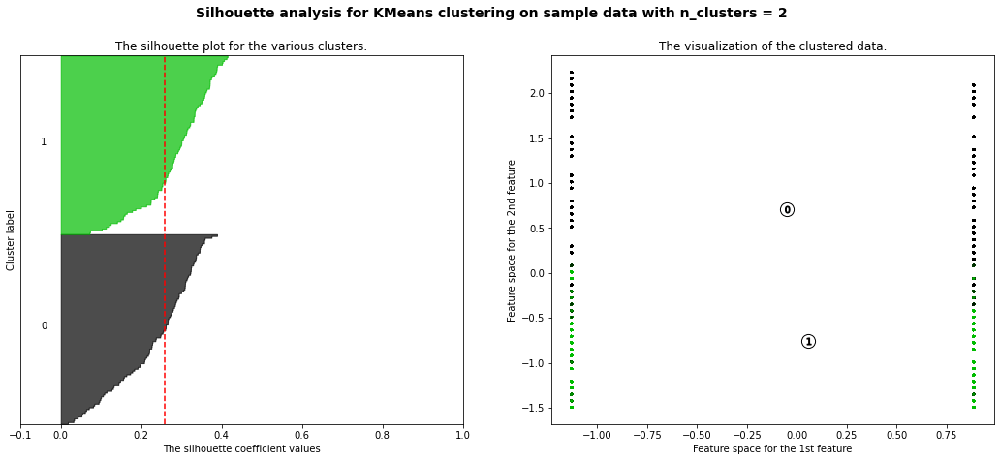

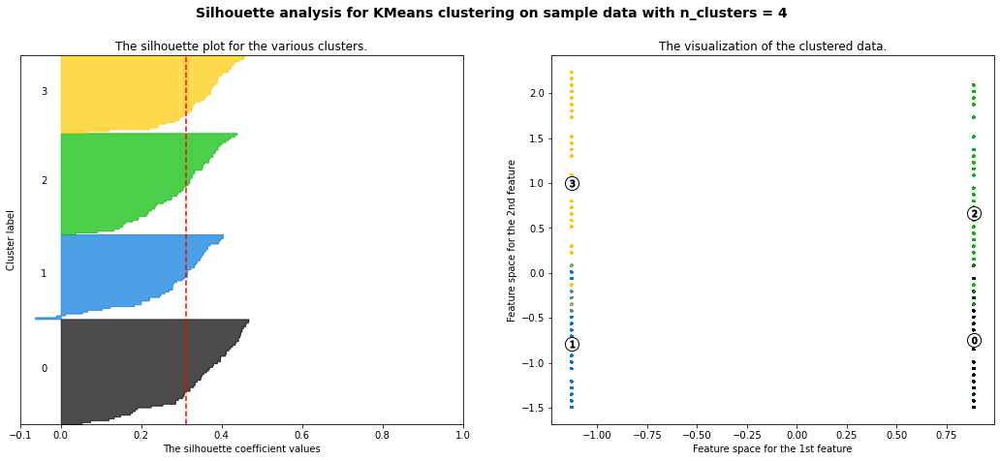

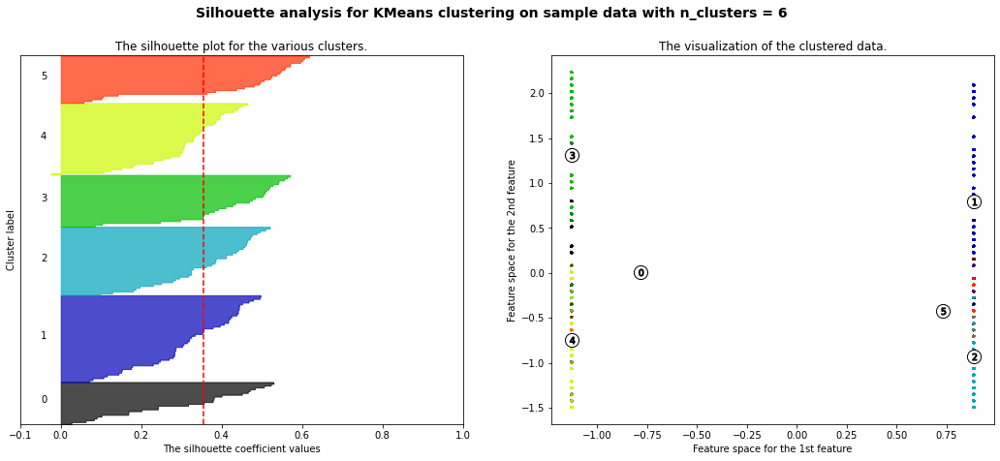

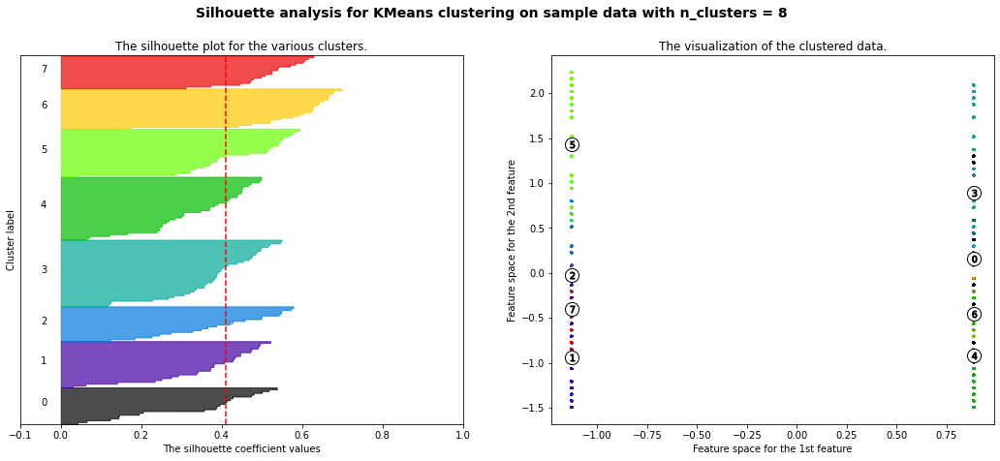

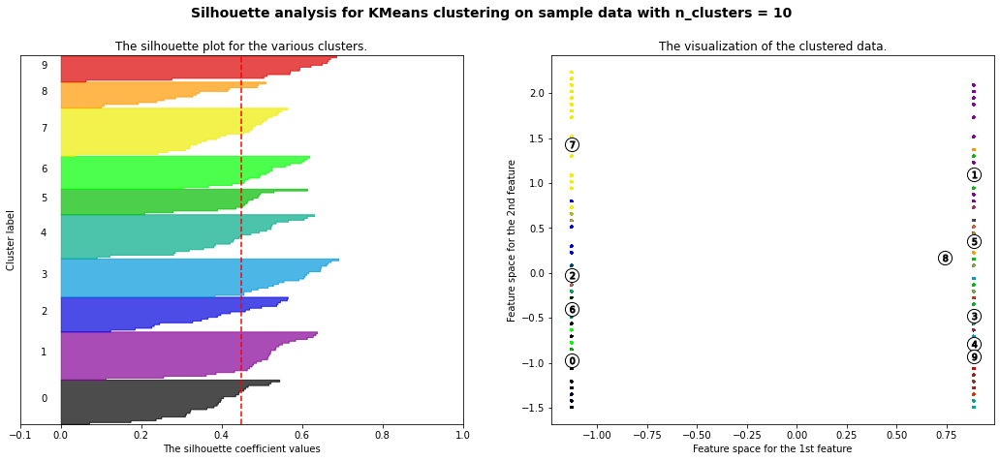

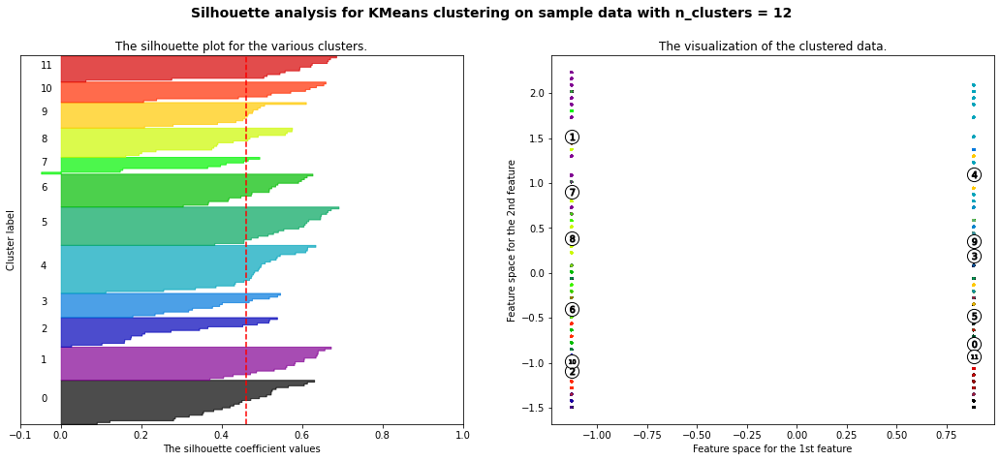

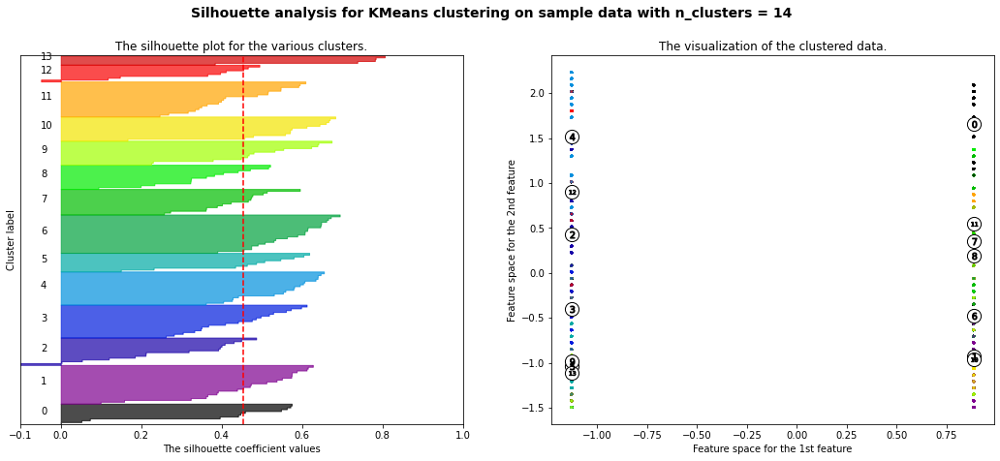

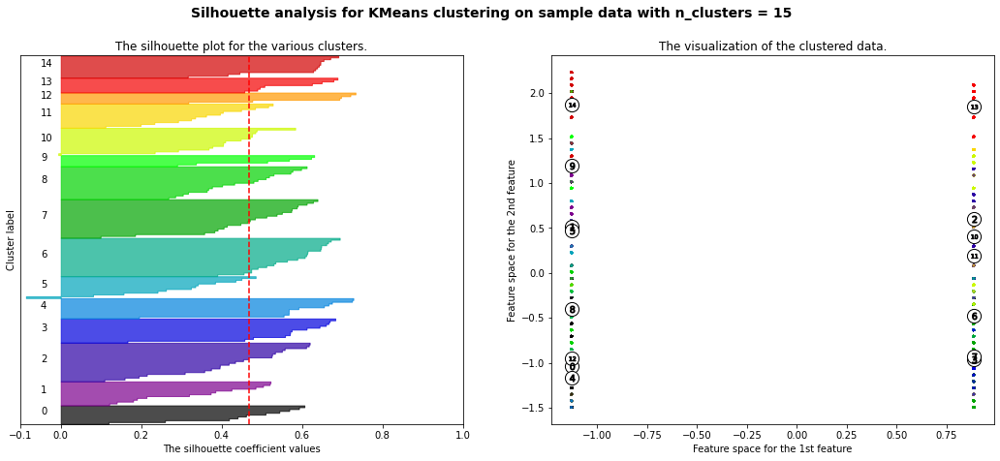

In [37]:
range_n_clusters =[2,4,6,8,10,12,14,15] #specified clusters range at values of n

for n_clusters in range_n_clusters:
    fig, (ax1, ax2) = plt.subplots(1, 2) #creating 1 row and 2 column subplots 
    fig.set_size_inches(18, 7)
    ax1.set_xlim([-0.1, 1]) #first subplot should lie within the provided range
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10]) 
    #(n_clusters+1)*10 is for inserting blank space between silhouette
    
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [38]:
#BUILDING K-MEANS MODEL
model = KMeans(n_clusters=8) #Substituting n=8
predictions = model.fit_predict(X)

In [39]:
new_df = pd.merge(df,pd.Series(predictions,name='Cluster'),on=df.index)
new_df.drop('key_0',axis=1,inplace=True)
new_df.head(20)

,Gender,Age,Annual Income (k$),Spending Score (1-100),Cluster
0,0,19.0,15.0,39.0,0
1,0,21.0,15.0,81.0,0
2,1,20.0,16.0,6.0,4
3,1,23.0,16.0,77.0,4
4,1,31.0,17.0,40.0,4
5,1,22.0,17.0,76.0,4
6,1,35.0,18.0,6.0,5
7,1,23.0,18.0,94.0,4
8,0,64.0,19.0,3.0,3
9,1,30.0,19.0,72.0,4


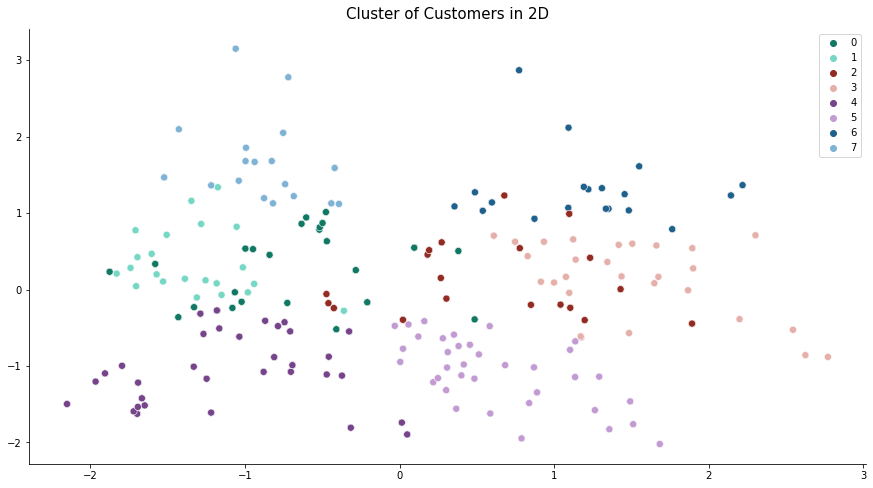

In [43]:
#VISULAIZING THE CLUSTERS IN 2D
pca = PCA(2)
pca.fit(X)
X_PCA = pca.transform(X)
plt.figure(figsize=(15,8))

#plotting scatterplot with 6 dominant colors from color mix and colors dark to differentiate them uniquely.
sns.scatterplot(x=X_PCA[:, 0], y=X_PCA[:, 1], hue=predictions, palette=[colors_mix[0],colors_mix[1], colors_mix[2],colors_mix[3], colors_mix[4],colors_mix[5],colors_mix[6],colors_mix[7]], s=50)
plt.title('Cluster of Customers in 2D', size=15, pad=10)
sns.despine()
plt.legend(loc=0, bbox_to_anchor=[1,1])
plt.show()

In [47]:
#VISULAIZING THE CLUSTERS IN 3D
pca = PCA(3)
pca.fit(X)
X_PCA = pca.transform(X)

#plotting scatterplot with 6 dominant colors from color mix and colors dark to differentiate them uniquely.
fig = px.scatter_3d(x=X_PCA[:,0], y=X_PCA[:,1], z=X_PCA[:,2],
                    color=predictions,opacity=0.8, color_continuous_scale=[colors_mix[0],colors_mix[1], colors_mix[2],colors_mix[3], colors_mix[4],colors_mix[5],colors_mix[6],colors_mix[7]],
                   width=800,height=800)

fig.update_layout(font_family='monospace',
    title=dict(text='Customer Clusters in 3D',x=0.5,y=0.95,
    font=dict(color=colors_dark[2],size=20)),
    coloraxis_showscale=False)
fig.show()

In [45]:
silhouette_score(X,cluster_labels)

0.46779817086800024

###The silhouette_score for the K-means clustering at n_cluster = 8 is 0.46779817086800024

###Data Analaysis remaining parts.

In [41]:
#DISTRIBUTION OF ANNUAL INCOME AFTER CLUSTERING
fig = px.histogram(new_df,x='Annual Income (k$)',color='Cluster',template='plotly_white',
                  marginal='box',opacity=0.7,nbins=50,color_discrete_sequence=[colors_mix[0],colors_mix[1], colors_mix[2],colors_mix[3], colors_mix[4],colors_mix[5],colors_mix[6],colors_mix[7],colors_mix[8],colors_mix[9],colors_mix[10],colors_mix[11],colors_mix[12],colors_mix[13]],
                  barmode='group',histfunc='count')

fig.update_layout(
    font_family='monospace',
    title=dict(text='Distribution Of Annual Income After Clustering',x=0.5,y=0.95,
               font=dict(color=colors_dark[2],size=20)),
    xaxis_title_text='Annual Income (k$)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

In [40]:
#DISTRIBUTION OF AGE AFTER CLUSTERING

fig = px.histogram(new_df,x='Age',color='Cluster',template='plotly_white',
                  marginal='box',opacity=0.7,nbins=50,color_discrete_sequence=[colors_mix[0],colors_mix[1], colors_mix[2],colors_mix[3], colors_mix[4],colors_mix[5],colors_mix[6],colors_mix[7],colors_mix[8],colors_mix[9],colors_mix[10],colors_mix[11],colors_mix[12],colors_mix[13]],
                  barmode='group',histfunc='count')

fig.update_layout(
    font_family='monospace',
    title=dict(text='Distribution Of Age After Clustering',x=0.5,y=0.95,
               font=dict(color=colors_dark[2],size=20)),
    xaxis_title_text='Age',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

In [42]:
#DISTRIBUTION OF SPENDING SCORE AFTER CLUSTERING
fig = px.histogram(new_df,x='Spending Score (1-100)',color='Cluster',template='plotly_white',
                  marginal='box',opacity=0.7,nbins=25,color_discrete_sequence=[colors_mix[0],colors_mix[1], colors_mix[2],colors_mix[3], colors_mix[4],colors_mix[5],colors_mix[6],colors_mix[7],colors_mix[8],colors_mix[9],colors_mix[10],colors_mix[11],colors_mix[12],colors_mix[13]],
                  barmode='group',histfunc='count')

fig.update_layout(
    font_family='monospace',
    title=dict(text='Distribution Of Spending Score After Clustering',x=0.5,y=0.95,
               font=dict(color=colors_dark[2],size=20)),
    xaxis_title_text='Spending Score (1-100)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()